# ViT Attention

### 🎯 Objectives

---

## Part 0: Setup
- Ensure CUDA is available and pytorch is built with CUDA for optimal performance.
- List relevant package versions
- Download ImageNet-1k classes
- Set source image path

In [93]:
import torch

# Check if CUDA-enabled GPU is available
if torch.cuda.is_available():
    print("GPU is available!")
    print(f"GPU Name: {torch.cuda.get_device_name(0)}")
    print(f"Device Count: {torch.cuda.device_count()}")
else:
    print("GPU is not available. Using CPU.")

device = 'cuda' if torch.cuda.is_available() else 'cpu'
print(f"Using device: {device}")

print(f"Torch version: {torch.__version__}")
if torch.cuda.is_available():
    print(f"CUDA version: {torch.version.cuda}")

GPU is available!
GPU Name: NVIDIA GeForce RTX 4070 SUPER
Device Count: 1
Using device: cuda
Torch version: 2.6.0+cu126
CUDA version: 12.6


In [94]:
def get_imagenet_class_names():
    """
    Returns a dictionary mapping ImageNet-1k class indices to their names.
    """
    import json
    from urllib.request import urlopen
    
    # Try to download ImageNet class names
    try:
        url = "https://raw.githubusercontent.com/pytorch/hub/master/imagenet_classes.txt"
        with urlopen(url) as response:
            class_names = [line.decode('utf-8').strip() for line in response.readlines()]
            return {i: name for i, name in enumerate(class_names)}
    except:
        # Fallback for a few classes
        return {
            297: "jaguar, panther",
            916: "wildcat",
            367: "chihuahua",
            535: "otter",
            387: "meerkat, mierkat"
        }

# Get the class names
imagenet_classes = get_imagenet_class_names()

In [95]:
image_path = "../data/images/lesser_panda3.jpg"

## Part 1: Model Setup & Inference

In [96]:
import torch.nn as nn
import timm
import torchvision.transforms as T
from PIL import Image
import matplotlib.pyplot as plt
import tqdm as notebook_tqdm

# Load ViT model:
#   'base': The model size (base configuration)
#   'patch16': Images are divided into 16×16 pixel patches
#   '224': The model expects 224×224 pixel images
model = timm.create_model('vit_base_patch16_224', pretrained=True)

# Set the model to evaluation mode
model.eval()

# Store hooked attention maps
attention_maps = []

# Safely override the forward function of transformer blocks
for blk in model.blocks:

    # Provide default drop_path if it doesn't exist
    # drop_path, aka stochastic dpeth, is a regularization techiqnue that drops entire blocks
    if not hasattr(blk, 'drop_path'):
        blk.drop_path = nn.Identity()
    
    def old_forward(self, x):
        """
        Custom forward function for transformer blocks to extract attention maps.
        This function replaces the original forward function of the transformer block
        and maintains the same functionality. It also captures the attention weights
        in each block for later viusalization. (BROKEN)
        """
        B, N, C = x.shape

        qkv = self.attn.qkv(x).reshape(B, N, 3, self.attn.num_heads, C // self.attn.num_heads)
        qkv = qkv.permute(2, 0, 3, 1, 4)  # (3, B, num_heads, N, head_dim)
        q, k, v = qkv[0], qkv[1], qkv[2]

        attn_scores = (q @ k.transpose(-2, -1)) * self.attn.scale
        attn_weights = attn_scores.softmax(dim=-1)  # (B, num_heads, N, N)

        # Store attention weights for visualization as member variable
        self.attn_weights = attn_weights

        attn_output = (attn_weights @ v).transpose(1, 2).reshape(B, N, C)
        attn_output = self.attn.proj(attn_output)

        x = x + self.drop_path(attn_output)
        x = x + self.drop_path(self.mlp(self.norm2(x)))

        return self.norm1(x)
    
    def new_forward(self, x):
        """
        Custom forward function for transformer blocks to extract attention maps.
        This function replaces the original forward function of the transformer block
        and maintains the same functionality. It also captures the attention weights
        in each block for later visualization.
        """
        B, N, C = x.shape
        
        # Apply normalization BEFORE attention (pre-norm approach)
        x_norm = self.norm1(x)
        
        # Get query, key, value projections
        qkv = self.attn.qkv(x_norm).reshape(B, N, 3, self.attn.num_heads, C // self.attn.num_heads)
        qkv = qkv.permute(2, 0, 3, 1, 4)  # (3, B, num_heads, N, head_dim)
        q, k, v = qkv[0], qkv[1], qkv[2]
        
        # Calculate attention scores and weights
        attn_scores = (q @ k.transpose(-2, -1)) * self.attn.scale
        attn_weights = attn_scores.softmax(dim=-1)  # (B, num_heads, N, N)
        
        # Store attention weights for visualization
        self.attn_weights = attn_weights
        
        # Apply attention to values and project back
        attn_output = (attn_weights @ v).transpose(1, 2).reshape(B, N, C)
        attn_output = self.attn.proj(attn_output)
        
        # First residual connection
        x = x + self.drop_path(attn_output)
        
        # Apply normalization BEFORE MLP (pre-norm approach)
        x_norm2 = self.norm2(x)
        mlp_output = self.mlp(x_norm2)
        
        # Second residual connection
        x = x + self.drop_path(mlp_output)
        
        return x

    # Inject our forward method into each block
    # __get__ binds a new method to an instance of a class
    blk.forward = new_forward.__get__(blk, type(blk))

In [97]:
# Load image
image = Image.open(image_path).convert("RGB")

# Define the transformation to match the model's input requirements
transform = T.Compose([
    T.Resize((224, 224)),
    T.ToTensor(),
    T.Normalize((0.5,), (0.5,))
])

# Apply the transformation to the image
input_tensor = transform(image).unsqueeze(0)

# Forward pass 
# No gradient tracking is needed for inference, only for training
with torch.no_grad():

   # Execute the model on the input tensor
    output = model(input_tensor)

    # Get the top 5 predictions
    top5_probabilities, top5_class_indices = torch.topk(output.softmax(dim=1) * 100, k=5)

    # Print top 5 predictions with names
    print("Top 5 predictions:")
    for i in range(5):
        class_idx = top5_class_indices[0][i].item()
        class_name = imagenet_classes.get(class_idx, f"Unknown (ID: {class_idx})")
        print(f"{i+1}. {class_name} (ID: {class_idx}): {top5_probabilities[0][i].item():.2f}%")

# Extract stored attention maps
attn_maps_np = [blk.attn_weights.squeeze(0).cpu().numpy() for blk in model.blocks]

Top 5 predictions:
1. lesser panda (ID: 387): 81.93%
2. giant panda (ID: 388): 0.14%
3. polecat (ID: 358): 0.13%
4. howler monkey (ID: 379): 0.09%
5. jackfruit (ID: 955): 0.08%


## Part 2: Visualize Attention
- Visualize all attention heads at every layer
- Overlay average of final attention layer on source image

### Visualize All Attention

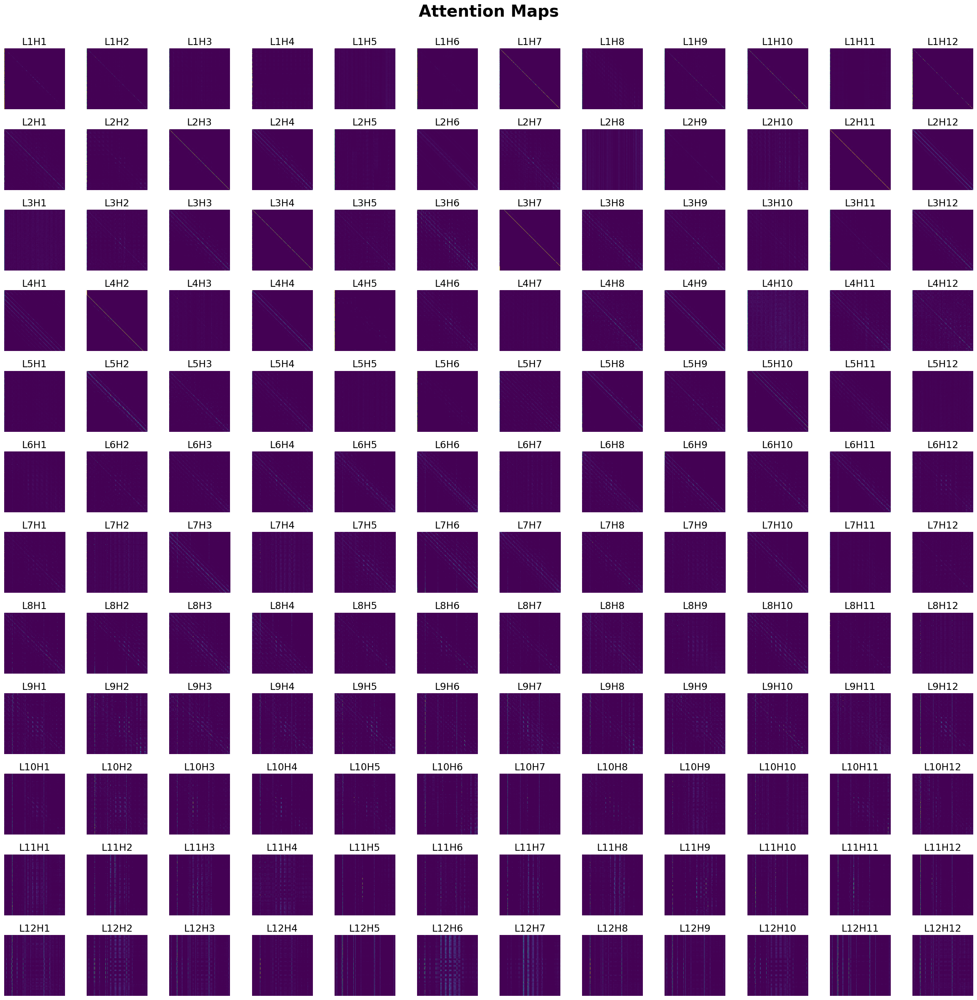

In [98]:
# Visualize attention maps
def visualize_attention(attn_maps_np):
    num_layers = len(attn_maps_np)
    num_heads = attn_maps_np[0].shape[0]

    fig, axes = plt.subplots(num_layers, num_heads, figsize=(num_heads * 2, num_layers * 2))

    for i in range(num_layers):
        for j in range(num_heads):
            ax = axes[i, j] if num_layers > 1 else axes[j]
            attn_map = attn_maps_np[i][j]  # shape: [num_tokens, num_tokens]
            ax.imshow(attn_map, cmap='viridis')
            ax.set_title(f"L{i+1}H{j+1}")
            ax.axis('off')

    plt.suptitle("Attention Maps", fontsize=28, y=1, fontweight='bold')
    plt.tight_layout()
    plt.savefig("./figures/all_heads_all_layers_attention_maps.png", dpi=300)
    plt.show()

visualize_attention(attn_maps_np)

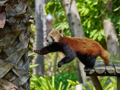

In [99]:
from PIL import Image
from IPython.display import display

# Display the original image
display(image.resize(( int(image.width * 0.15), int(image.height * 0.15))))

### Overlay Attention Maps

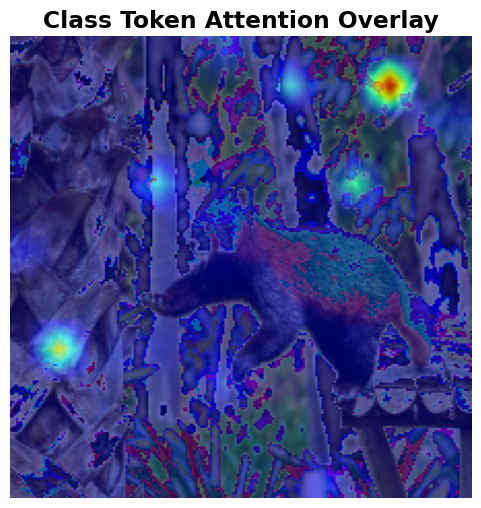

In [100]:
import numpy as np
import cv2
from torchvision.transforms.functional import to_pil_image

def show_attention_overlay(image_tensor, attn_map, patch_size=16, alpha=0.6):
    """
    Overlay attention map on top of the input image.
    """

    # Convert tensor to PIL image
    image = to_pil_image(image_tensor.squeeze(0).cpu()).convert("RGB")
    image_np = np.array(image)

    # Use only the class token's attention to other tokens (shape: [num_tokens])
    # In ViT, first token (index 0) is class token, so take its attention
    cls_attn = attn_map[:, 0, 1:]  # Exclude the class token itself

    # Assume square grid of patches
    num_patches = cls_attn.shape[-1]
    grid_size = int(np.sqrt(num_patches))
    cls_attn_map = cls_attn.reshape(grid_size, grid_size)

    # Normalize attention map
    cls_attn_map -= cls_attn_map.min()
    cls_attn_map /= cls_attn_map.max()

    # Resize attention map to image resolution
    cls_attn_map_resized = cv2.resize(cls_attn_map, (image_np.shape[1], image_np.shape[0]))
    cls_attn_map_color = cv2.applyColorMap(np.uint8(255 * cls_attn_map_resized), cv2.COLORMAP_JET)
    cls_attn_map_color = cv2.cvtColor(cls_attn_map_color, cv2.COLOR_BGR2RGB)

    # Overlay attention on original image
    overlay = (1 - alpha) * image_np + alpha * cls_attn_map_color
    overlay = overlay.astype(np.uint8)

    # Show result
    plt.figure(figsize=(6, 6))
    plt.imshow(overlay)
    plt.axis("off")
    plt.title("Class Token Attention Overlay", fontweight="bold")
    plt.savefig("./figures/final_layer_avg_attention_overlay.png", dpi=300)
    plt.show()

# Get the last layer's attention map
last_layer_attn = attn_maps_np[-1]  # [num_heads, num_tokens, num_tokens]

# Average attention map across heads
avg_attn = np.mean(last_layer_attn, axis=0, keepdims=True)  # [1, num_tokens, num_tokens]

# Show attention overlayed on the image
show_attention_overlay(input_tensor, avg_attn)

### Compare Attention Across Layers
Let's observe how attention patterns evolve from early to deeper layers.
- Extract and visualize attention maps from multiple layers, and overlay them over the source image
- Plot them side-by-side for comparison.

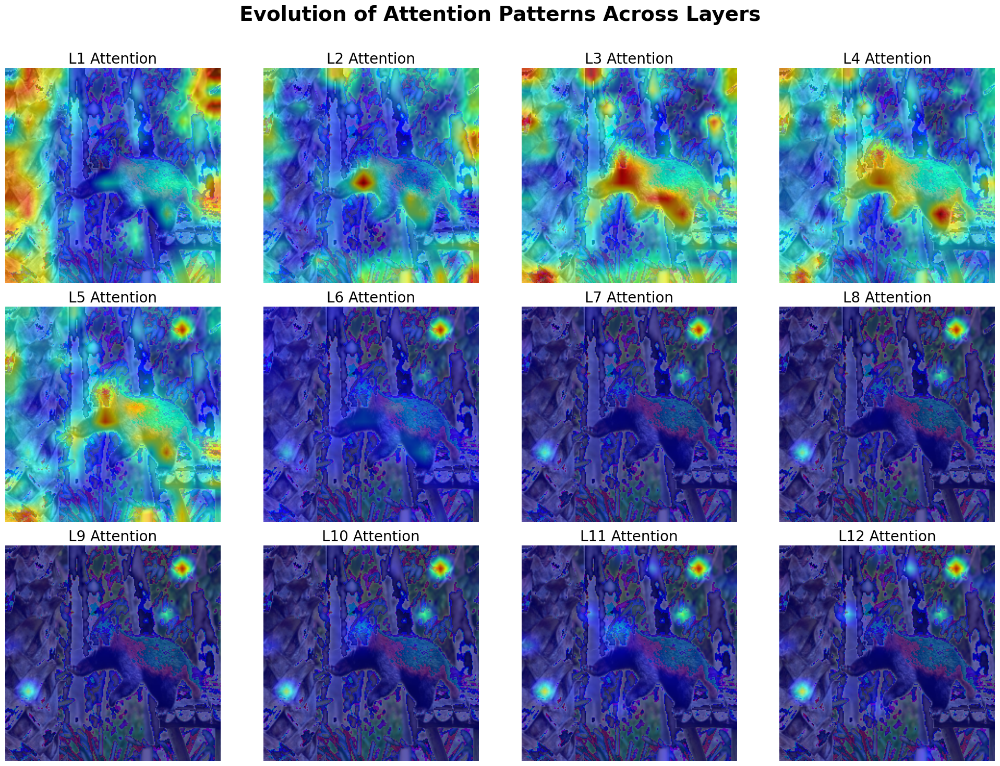

In [101]:
def compare_attention_across_layers(image_tensor, attn_maps_np, layers_to_compare=None, figsize=(20, 15)):
    """
    Compare attention patterns across different layers by visualizing them in a 4x3 grid.
    
    Args:
        image_tensor: The input image tensor
        attn_maps_np: List of attention maps from all layers
        layers_to_compare: Indices of layers to compare (default: all layers)
        figsize: Size of the figure
    """
    # Default to all layers if not specified
    if layers_to_compare is None:
        layers_to_compare = list(range(len(attn_maps_np)))
    
    image = to_pil_image(image_tensor.squeeze(0).cpu()).convert("RGB")
    image_np = np.array(image)
    
    # Set up the figure with 4x3 grid of subplots
    plt.rcParams.update({'font.size': 14})  # Increase base font size
    fig, axes = plt.subplots(3, 4, figsize=figsize)
    
    # Flatten axes for easy indexing
    axes = axes.flatten()
    
    for i, layer_idx in enumerate(layers_to_compare):
        # Skip if layer index is out of range
        if layer_idx >= len(attn_maps_np) or i >= len(axes):
            print(f"Warning: Layer {layer_idx} does not exist or exceeds grid capacity. Skipping.")
            continue
            
        # Get attention map for this layer and average across heads
        layer_attn = attn_maps_np[layer_idx]  # [num_heads, num_tokens, num_tokens]
        avg_head_attn = np.mean(layer_attn, axis=0)  # [num_tokens, num_tokens]
        
        # Extract class token's attention to other tokens
        cls_attn = avg_head_attn[0, 1:]  # Exclude attention to class token itself
        
        # Reshape to grid
        num_patches = cls_attn.shape[0]
        grid_size = int(np.sqrt(num_patches))
        cls_attn_map = cls_attn.reshape(grid_size, grid_size)
        
        # Normalize attention map
        cls_attn_map -= cls_attn_map.min()
        cls_attn_map /= cls_attn_map.max()
        
        # Resize attention map to image resolution
        cls_attn_map_resized = cv2.resize(cls_attn_map, (image_np.shape[1], image_np.shape[0]))
        
        # Apply colormap
        cls_attn_map_color = cv2.applyColorMap(np.uint8(255 * cls_attn_map_resized), cv2.COLORMAP_JET)
        cls_attn_map_color = cv2.cvtColor(cls_attn_map_color, cv2.COLOR_BGR2RGB)
        
        # Overlay attention on original image
        alpha = 0.6  # Transparency
        overlay = (1 - alpha) * image_np + alpha * cls_attn_map_color
        overlay = overlay.astype(np.uint8)
        
        # Display on the appropriate subplot with larger title font
        axes[i].imshow(overlay)
        axes[i].set_title(f"L{layer_idx+1} Attention", fontsize=20)  # Larger title font
        axes[i].axis('off')
    
    # Hide any unused subplots
    for j in range(len(layers_to_compare), len(axes)):
        axes[j].axis('off')
    
    plt.tight_layout()
    plt.suptitle("Evolution of Attention Patterns Across Layers", fontsize=28, y=0.98, fontweight="bold")  # Larger title
    plt.subplots_adjust(top=0.90)
    plt.savefig("./figures/all_layers_avg_attention_overlay.png", dpi=300)
    plt.show()

# Apply the function with all layers
compare_attention_across_layers(input_tensor, attn_maps_np)

### Compare Attention Across Heads
Let's see how different heads focus on different regions.
- Visualize each head separately on the final layer

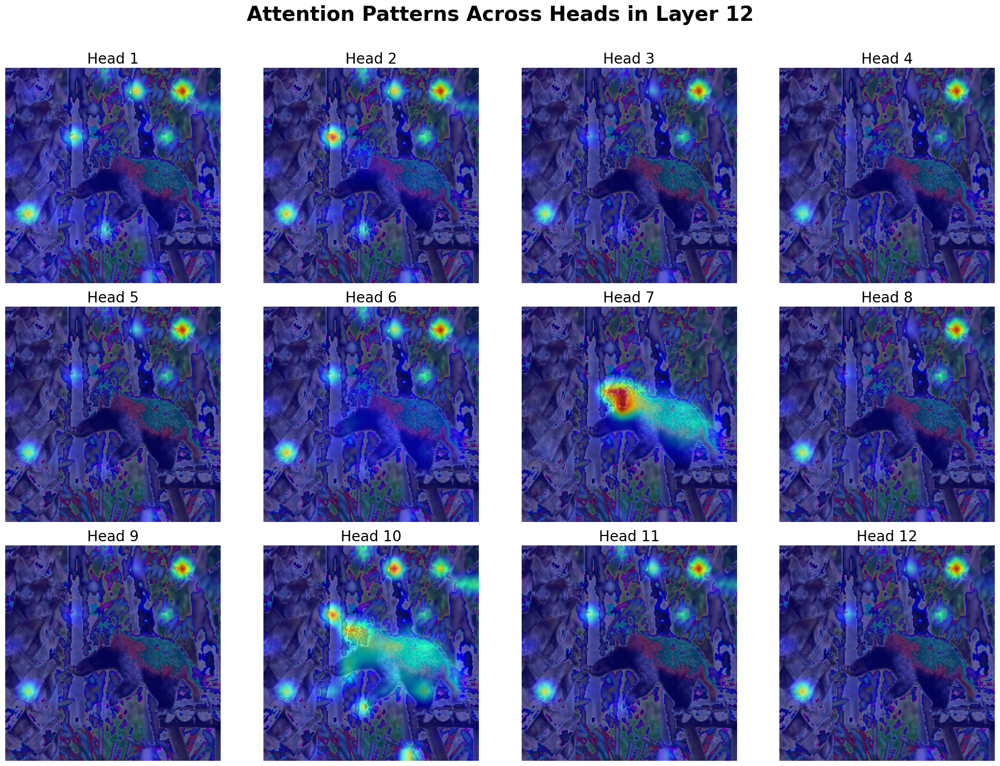

In [102]:
def compare_attention_across_heads(image_tensor, attn_maps_np, layer_idx=11, figsize=(20, 15)):
    """
    Compare attention patterns across different attention heads in a specific layer.
    
    Args:
        image_tensor: The input image tensor
        attn_maps_np: List of attention maps from all layers
        layer_idx: Index of the layer to visualize (default: 11, the last layer)
        figsize: Size of the figure
    """
    image = to_pil_image(image_tensor.squeeze(0).cpu()).convert("RGB")
    image_np = np.array(image)
    
    # Get the attention map for the specified layer
    layer_attn = attn_maps_np[layer_idx]  # [num_heads, num_tokens, num_tokens]
    num_heads = layer_attn.shape[0]
    
    # Calculate grid dimensions - typically ViT has 12 heads, so a 4x3 grid works well
    num_cols = 4
    num_rows = (num_heads + num_cols - 1) // num_cols  # Ceiling division
    
    # Set up the figure with subplots
    plt.rcParams.update({'font.size': 14})  # Increase base font size
    fig, axes = plt.subplots(num_rows, num_cols, figsize=figsize)
    
    # Flatten axes for easy indexing
    axes = axes.flatten()
    
    for head_idx in range(num_heads):
        if head_idx >= len(axes):
            print(f"Warning: Head {head_idx} exceeds grid capacity. Skipping.")
            continue
            
        # Extract class token's attention to other tokens for this head
        head_attn = layer_attn[head_idx]  # [num_tokens, num_tokens]
        cls_attn = head_attn[0, 1:]  # Exclude attention to class token itself
        
        # Reshape to grid
        num_patches = cls_attn.shape[0]
        grid_size = int(np.sqrt(num_patches))
        cls_attn_map = cls_attn.reshape(grid_size, grid_size)
        
        # Normalize attention map
        cls_attn_map -= cls_attn_map.min()
        cls_attn_map /= cls_attn_map.max()
        
        # Resize attention map to image resolution
        cls_attn_map_resized = cv2.resize(cls_attn_map, (image_np.shape[1], image_np.shape[0]))
        
        # Apply colormap
        cls_attn_map_color = cv2.applyColorMap(np.uint8(255 * cls_attn_map_resized), cv2.COLORMAP_JET)
        cls_attn_map_color = cv2.cvtColor(cls_attn_map_color, cv2.COLOR_BGR2RGB)
        
        # Overlay attention on original image
        alpha = 0.6  # Transparency
        overlay = (1 - alpha) * image_np + alpha * cls_attn_map_color
        overlay = overlay.astype(np.uint8)
        
        # Display on the appropriate subplot
        axes[head_idx].imshow(overlay)
        axes[head_idx].set_title(f"Head {head_idx+1}", fontsize=20)
        axes[head_idx].axis('off')
    
    # Hide any unused subplots
    for j in range(num_heads, len(axes)):
        axes[j].axis('off')
    
    plt.tight_layout()
    plt.suptitle(f"Attention Patterns Across Heads in Layer {layer_idx+1}", fontsize=28, y=0.98, fontweight="bold")
    plt.subplots_adjust(top=0.90)
    plt.savefig(f"./figures/layer{layer_idx+1}_heads_attention.png", dpi=300)
    plt.show()

# Apply the function to the last layer (index 11)
compare_attention_across_heads(input_tensor, attn_maps_np, layer_idx=11)

# Optionally, visualize heads from an earlier layer for comparison
# compare_attention_across_heads(input_tensor, attn_maps_np, layer_idx=5)  # Middle layer

### Mean Attention Distance

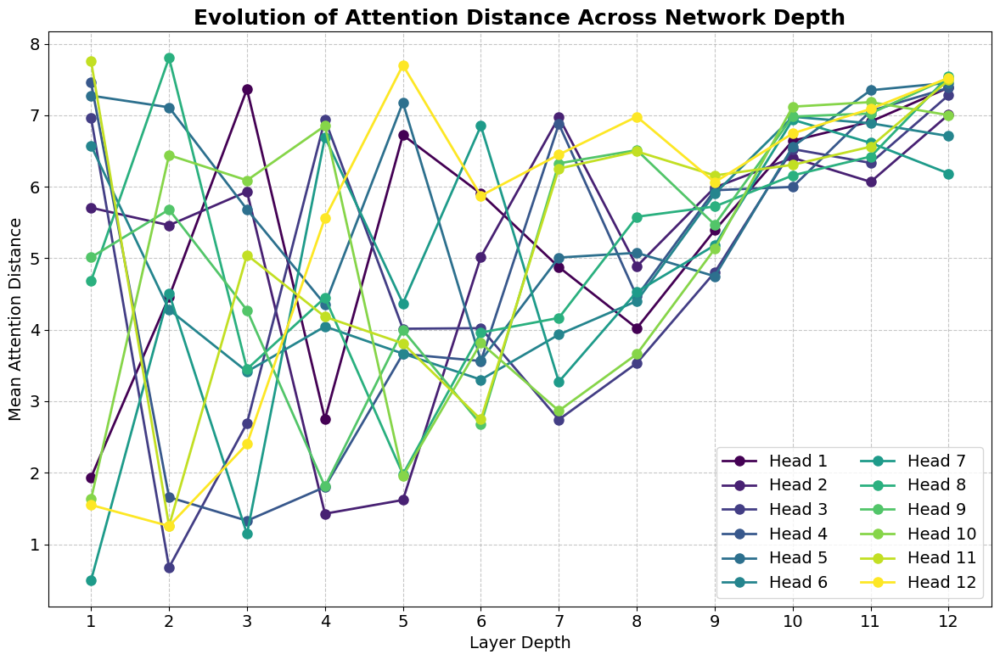

In [103]:
def calculate_attention_distances(attn_maps_np, image_size=224, patch_size=16):
    """
    Calculate mean attention distance for each head in each layer.
    
    Args:
        attn_maps_np: List of attention maps from all layers
        image_size: Size of the input image (default: 224)
        patch_size: Size of the patches (default: 16)
        
    Returns:
        ndarray: Mean attention distances with shape [num_layers, num_heads]
    """
    num_layers = len(attn_maps_np)
    num_heads = attn_maps_np[0].shape[0]
    
    # Number of patches along one dimension (assuming square image)
    grid_size = image_size // patch_size
    
    # Generate patch coordinates (center of each patch)
    # Adding 0.5 to get to the center of each patch
    y_indices = np.arange(grid_size) + 0.5
    x_indices = np.arange(grid_size) + 0.5
    
    # Create coordinate matrices
    yy, xx = np.meshgrid(y_indices, x_indices)
    
    # Flatten to get coordinates for each patch
    patch_positions = np.stack([xx.flatten(), yy.flatten()], axis=1)  # [num_patches, 2]
    
    # Pre-compute pairwise distances between all patches
    num_patches = grid_size * grid_size
    distance_matrix = np.zeros((num_patches, num_patches))
    
    for i in range(num_patches):
        for j in range(num_patches):
            # Euclidean distance in grid units
            distance_matrix[i, j] = np.sqrt(np.sum((patch_positions[i] - patch_positions[j])**2))
    
    # Initialize array to store mean distances
    mean_distances = np.zeros((num_layers, num_heads))
    
    for layer_idx in range(num_layers):
        layer_attn = attn_maps_np[layer_idx]  # [num_heads, num_tokens, num_tokens]
        
        for head_idx in range(num_heads):
            head_attn = layer_attn[head_idx]  # [num_tokens, num_tokens]
            
            # We'll use attention from patch tokens to patch tokens
            # Skip the CLS token (index 0)
            patch_attn = head_attn[1:, 1:]  # [num_patches, num_patches]
            
            # For each query (patch), calculate the expected distance
            # by weighting the distance to each key with the attention weight
            expected_distances = []
            
            for i in range(num_patches):
                # Get attention weights for this query patch
                # Normalize to ensure they sum to 1
                attn_weights = patch_attn[i]
                attn_weights = attn_weights / attn_weights.sum()
                
                # Calculate expected distance as weighted sum
                expected_distance = np.sum(distance_matrix[i] * attn_weights)
                expected_distances.append(expected_distance)
            
            # Take the mean across all query patches
            mean_distances[layer_idx, head_idx] = np.mean(expected_distances)
    
    return mean_distances

def plot_attention_distances(mean_distances, figsize=(12, 8)):
    """
    Plot mean attention distance across layers for each head.
    
    Args:
        mean_distances: ndarray with shape [num_layers, num_heads]
        figsize: Size of the figure
    """
    num_layers, num_heads = mean_distances.shape
    
    plt.figure(figsize=figsize)
    
    # Create a colormap for the heads
    colors = plt.cm.viridis(np.linspace(0, 1, num_heads))
    
    # Plot each head's mean attention distance across layers
    for head_idx in range(num_heads):
        plt.plot(
            range(1, num_layers + 1),  # x-axis: layer index (1-indexed)
            mean_distances[:, head_idx],  # y-axis: mean distance
            label=f"Head {head_idx + 1}",
            color=colors[head_idx],
            marker='o',
            linestyle='-',
            linewidth=2,
            markersize=8
        )
    
    plt.xlabel('Layer Depth', fontsize=14)
    plt.ylabel('Mean Attention Distance', fontsize=14)
    plt.title('Evolution of Attention Distance Across Network Depth', fontsize=18, fontweight='bold')
    plt.grid(True, linestyle='--', alpha=0.7)
    plt.xticks(range(1, num_layers + 1))
    
    # Set y-axis to logarithmic scale
    # plt.yscale('log')
    
    # Add legend in the top left corner with 2 columns
    plt.legend(loc='lower right', ncol=2)
    
    plt.tight_layout()
    plt.savefig("./figures/mean_attention_distance.png", dpi=300, bbox_inches='tight')
    plt.show()

# Calculate mean attention distances
mean_distances = calculate_attention_distances(attn_maps_np)

# Plot the results
plot_attention_distances(mean_distances)